### Comparativas varias sobre AOD por epocas

In [1]:
# Library
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
import scipy.stats
from sklearn.metrics import root_mean_squared_error
from math import sqrt
import os
from os import listdir
from datetime import datetime
import pandas as pd
from matplotlib.dates import DateFormatter
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
from sklearn.linear_model import LinearRegression

      Unnamed: 0        date  AOD_550_MODIS_mean  AOD_550_MAIAC_mean  \
0              1  2015-01-02             0.21980            0.050560   
1              2  2015-01-02             0.05462            0.050560   
2              3  2015-01-03             0.06971            0.057545   
3              4  2015-01-03             0.13725            0.057545   
4              5  2015-01-04             0.02300            0.162360   
...          ...         ...                 ...                 ...   
2004        2210  2022-12-26             0.20369            0.083370   
2005        2211  2022-12-28             0.54675            0.115690   
2006        2212  2022-12-29             0.15990            0.095705   
2007        2213  2022-12-30             0.42034            0.115305   
2008        2214  2022-12-31             0.14563            0.102385   

      AOD_550_AER_mean  dim  Month season  
0             0.026809    2      1      1  
1             0.026809    2      1      1  
2  

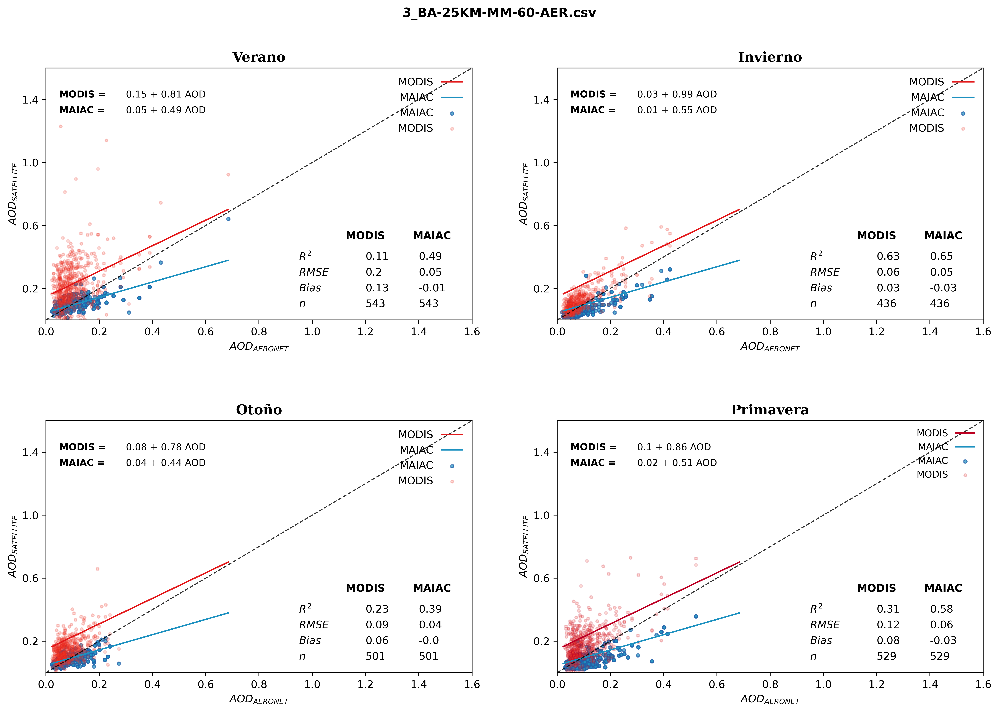

In [ ]:
#                                      ARGENTINA
# =============================================================================
os.chdir('D:/Josefina/paper_git/paper_maiac/datasets/processed/MMA_v2/')
archivo = "3_BA-25KM-MM-60-AER.csv"
arg = pd.read_csv(archivo)
data_arg= pd.DataFrame(arg) 
data_arg = data_arg.dropna()
data_arg['Month'] = pd.DatetimeIndex(data_arg['date']).month #revisar porque me toma los datos del dia y nodel mes
#Creo columnas en los df
data_arg['season'] = None
n = len(data_arg)

for i in range(0,n): #Cambiar el numero de filas 
    if data_arg['Month'][i] == 12 or data_arg['Month'][i] == 1 or data_arg['Month'][i] == 2:
        data_arg['season'][i] = 1        
    elif data_arg['Month'][i] == 3 or data_arg['Month'][i] == 4 or data_arg['Month'][i]  == 5:
        data_arg['season'][i] = 2
    elif data_arg['Month'][i] == 6 or data_arg['Month'][i] == 7 or data_arg['Month'][i] == 8:
        data_arg['season'][i] = 3
    elif data_arg['Month'][i] == 9 or data_arg['Month'][i] == 10 or data_arg['Month'][i] == 11:
        data_arg['season'][i] = 4
#Separo las columnas por estación del año                    
v_data_arg = data_arg[data_arg['season'] == 1]
o_data_arg = data_arg[data_arg['season'] == 2]
i_data_arg = data_arg[data_arg['season'] == 3]
p_data_arg = data_arg[data_arg['season'] == 4]
print(v_data_arg)
fig, ax = plt.subplots(ncols=2,nrows=2,  figsize=(16,10),dpi=500)
#The folder where the files of each station are located is browsed.


    ########################                VARIABLES                ########################
# ----------------VERANO ---------------- #
y_modis_v = v_data_arg ["AOD_550_MODIS_mean"]
y_maiac_v= v_data_arg["AOD_550_MAIAC_mean"]
x_v= v_data_arg["AOD_550_AER_mean"]
n_v = len(x_v)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_v , intercept_maiac_v , r_maiac_v , p_maiac_v , stderr_maiac_v  = scipy.stats.linregress(x_v , y_maiac_v)
slope_modis_v , intercept_modis_v , r_modis_v , p_modis_v , stderr_modis_v  = scipy.stats.linregress(x_v, y_modis_v)
# R2
R2_modis_v=r_modis_v*r_modis_v
R2_maiac_v=r_maiac_v*r_maiac_v
#Calculo RMSE
RMSE_modis_v = root_mean_squared_error(y_modis_v, x_v, squared = False)
RMSE_maiac_v = root_mean_squared_error(y_maiac_v, x_v)
bias_modis_v = round(( sum(y_modis_v - x_v)/n_v),2)
bias_maiac_v = round(( sum(y_maiac_v - x_v)/n_v),2)

y_modis_rshp_v = v_data_arg ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_v= v_data_arg["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_v= v_data_arg["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_v = LinearRegression()
linear_regresion_maiac_v = LinearRegression()

linear_regresion_modis_v.fit(x_rshp_v,y_modis_rshp_v)
linear_regresion_maiac_v.fit(x_rshp_v,y_maiac_rshp_v)

li_predict_maiac_v = linear_regresion_maiac_v.predict(x_rshp_v)
li_predict_modis_v = linear_regresion_modis_v.predict(x_rshp_v)


# ---------------- INVIERNO ---------------- #
y_modis_i = i_data_arg ["AOD_550_MODIS_mean"]
y_maiac_i= i_data_arg["AOD_550_MAIAC_mean"]
x_i = i_data_arg["AOD_550_AER_mean"]
n_i = len(x_i)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_i , intercept_maiac_i , r_maiac_i , p_maiac_i , stderr_maiac_i  = scipy.stats.linregress(x_i , y_maiac_i)
slope_modis_i , intercept_modis_i , r_modis_i , p_modis_i , stderr_modis_i  = scipy.stats.linregress(x_i, y_modis_i)
# R2
R2_modis_i=r_modis_i*r_modis_i
R2_maiac_i=r_maiac_i*r_maiac_i
#Calculo RMSE
RMSE_modis_i = root_mean_squared_error(y_modis_i, x_i)
RMSE_maiac_i = root_mean_squared_error(y_maiac_i, x_i)
bias_modis_i = round(( sum(y_modis_i - x_i)/n_i),2)
bias_maiac_i = round(( sum(y_maiac_i - x_i)/n_i),2)
y_modis_rshp_i = v_data_arg ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_i= v_data_arg["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_i= v_data_arg["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_i = LinearRegression()
linear_regresion_maiac_i = LinearRegression()

linear_regresion_modis_i.fit(x_rshp_i,y_modis_rshp_i)
linear_regresion_maiac_i.fit(x_rshp_i,y_maiac_rshp_i)

li_predict_maiac_i = linear_regresion_maiac_i.predict(x_rshp_i)
li_predict_modis_i = linear_regresion_modis_i.predict(x_rshp_i)

# ---------------- OTOÑO ---------------- #
y_modis_o = o_data_arg ["AOD_550_MODIS_mean"]
y_maiac_o= o_data_arg["AOD_550_MAIAC_mean"]
x_o= o_data_arg["AOD_550_AER_mean"]
n_o = len(x_o)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_o , intercept_maiac_o , r_maiac_o , p_maiac_o , stderr_maiac_o  = scipy.stats.linregress(x_o , y_maiac_o)
slope_modis_o , intercept_modis_o , r_modis_o , p_modis_o , stderr_modis_o  = scipy.stats.linregress(x_o, y_modis_o)
# R2
R2_modis_o=r_modis_o*r_modis_o
R2_maiac_o=r_maiac_o*r_maiac_o
#Calculo RMSE
RMSE_modis_o = root_mean_squared_error(y_modis_o, x_o, squared = False)
RMSE_maiac_o = root_mean_squared_error(y_maiac_o, x_o, squared = False)
bias_modis_o = round(( sum(y_modis_o - x_o)/n_o),2)
bias_maiac_o = round(( sum(y_maiac_o - x_o)/n_o),2)
y_modis_rshp_o = v_data_arg ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_o= v_data_arg["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_o= v_data_arg["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_o = LinearRegression()
linear_regresion_maiac_o = LinearRegression()

linear_regresion_modis_o.fit(x_rshp_o,y_modis_rshp_o)
linear_regresion_maiac_o.fit(x_rshp_o,y_maiac_rshp_o)

li_predict_maiac_o = linear_regresion_maiac_o.predict(x_rshp_o)
li_predict_modis_o = linear_regresion_modis_o.predict(x_rshp_o)

# ---------------- PRIMAVERA ---------------- #
y_modis_p = p_data_arg ["AOD_550_MODIS_mean"]
y_maiac_p= p_data_arg["AOD_550_MAIAC_mean"]
x_p= p_data_arg["AOD_550_AER_mean"]
n_p = len(x_p)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_p , intercept_maiac_p , r_maiac_p , p_maiac_p , stderr_maiac_p  = scipy.stats.linregress(x_p , y_maiac_p)
slope_modis_p , intercept_modis_p , r_modis_p , p_modis_p , stderr_modis_p  = scipy.stats.linregress(x_p, y_modis_p)
# R2
R2_modis_p=r_modis_p*r_modis_p
R2_maiac_p=r_maiac_p*r_maiac_p
#Calculo RMSE
RMSE_modis_p = root_mean_squared_error(y_modis_p, x_p, squared = False)
RMSE_maiac_p = root_mean_squared_error(y_maiac_p, x_p, squared = False)
bias_modis_p = round(( sum(y_modis_p - x_p)/n_p),2)
bias_maiac_p = round(( sum(y_maiac_p - x_p)/n_p),2)
y_modis_rshp_p = v_data_arg ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_p= v_data_arg["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_p= v_data_arg["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_p = LinearRegression()
linear_regresion_maiac_p = LinearRegression()

linear_regresion_modis_p.fit(x_rshp_p,y_modis_rshp_p)
linear_regresion_maiac_p.fit(x_rshp_p,y_maiac_rshp_p)

li_predict_maiac_p = linear_regresion_maiac_p.predict(x_rshp_p)
li_predict_modis_p = linear_regresion_modis_p.predict(x_rshp_p)



########################                PLOT    VERANO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][0].scatter(x_v, y_maiac_v,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][0].scatter(x_v, y_modis_v,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][0].plot(x_rshp_v,li_predict_modis_v,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][0].plot(x_rshp_v,li_predict_maiac_v,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")
#add the line 1:1
ax[0][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][0].set_xlim(0, 1.6)
ax[0][0].set_ylim(0, 1.6)

## Linear regression equation
ax[0][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][0].text(0.3, 1.4, (str(round (intercept_modis_v,2)) + " + "+ str(round (slope_modis_v,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][0].text(0.3, 1.3, (str(round (intercept_maiac_v,2)) + " + "+ str(round (slope_maiac_v,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[0][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[0][0].text(1.20, 0.4,(round(R2_modis_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.20, 0.30,  (round(RMSE_modis_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.20, 0.2, (round(bias_modis_v,2)) , fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.20, 0.1, n_v , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[0][0].text(1.40, 0.4,(round(R2_maiac_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.40, 0.30,   (round(RMSE_maiac_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.40, 0.2,  bias_maiac_v, fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.40, 0.1,  n_v , fontsize=10,ha="left", va="center")

# Title of each subplot corresponds to the name of the AERONET station.
ax[0][0].set_title("Verano",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend

ax[0][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
# Configuration of subplots
plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)

########################                PLOT    INVIERNO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][1].scatter(x_i, y_maiac_i, c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][1].scatter(x_i, y_modis_i,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][1].plot(x_rshp_i,li_predict_modis_i,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][1].plot(x_rshp_i,li_predict_maiac_i,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[0][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][1].set_xlim(0, 1.6)
ax[0][1].set_ylim(0, 1.6)

## Linear regression equation
ax[0][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][1].text(0.3, 1.4, (str(round (intercept_modis_i,2)) + " + "+ str(round (slope_modis_i,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][1].text(0.3, 1.3, (str(round (intercept_maiac_i,2)) + " + "+ str(round (slope_maiac_i,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[0][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[0][1].text(1.20, 0.4,(round(R2_modis_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.20, 0.30,  (round(RMSE_modis_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.20, 0.2, (round(bias_modis_i,2)) , fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.20, 0.1, n_i , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[0][1].text(1.40, 0.4,(round(R2_maiac_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.40, 0.30,   (round(RMSE_maiac_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.40, 0.2,  bias_maiac_i, fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.40, 0.1,  n_i , fontsize=10,ha="left", va="center")

# Title of each subplot corresponds to the name of the AERONET station.
ax[0][1].set_title("Invierno",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[0][1].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    OTOÑO           ########################
# Figure

#Scatter plot Unit vs Ref
ax[1][0].scatter(x_o, y_maiac_o,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][0].scatter(x_o, y_modis_o,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[1][0].plot(x_rshp_o,li_predict_modis_o,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][0].plot(x_rshp_o,li_predict_maiac_o,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][0].set_xlim(0, 1.6)
ax[1][0].set_ylim(0, 1.6)

## Linear regression equation
ax[1][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][0].text(0.3, 1.4, (str(round (intercept_modis_o,2)) + " + "+ str(round (slope_modis_o,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][0].text(0.3, 1.3, (str(round (intercept_maiac_o,2)) + " + "+ str(round (slope_maiac_o,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[1][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[1][0].text(1.20, 0.4,(round(R2_modis_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.20, 0.30,  (round(RMSE_modis_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.20, 0.2, (round(bias_modis_o,2)) , fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.20, 0.1, n_o , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[1][0].text(1.40, 0.4,(round(R2_maiac_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.40, 0.30,   (round(RMSE_maiac_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.40, 0.2,  bias_maiac_o, fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.40, 0.1,  n_o , fontsize=10,ha="left", va="center")

# Title of each subplot corresponds to the name of the AERONET station.
ax[1][0].set_title("Otoño",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    PRIMAVERA          ########################
# Figure
#Scatter plot Unit vs Ref
ax[1][1].scatter(x_p, y_maiac_p,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][1].scatter(x_p, y_modis_p,  c="#fc4e2a" ,edgecolors="#bd0026",alpha=0.2,  s=7,label = "MODIS")


ax[1][1].plot(x_rshp_p,li_predict_modis_p,c="#bd0026",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][1].plot(x_rshp_p,li_predict_maiac_p,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][1].set_xlim(0, 1.6)
ax[1][1].set_ylim(0, 1.6)

## Linear regression equation
ax[1][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][1].text(0.3, 1.4, (str(round (intercept_modis_p,2)) + " + "+ str(round (slope_modis_p,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][1].text(0.3, 1.3, (str(round (intercept_maiac_p,2)) + " + "+ str(round (slope_maiac_p,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[1][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[1][1].text(1.20, 0.4,(round(R2_modis_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.20, 0.30,  (round(RMSE_modis_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.20, 0.2, (round(bias_modis_p,2)) , fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.20, 0.1, n_p , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[1][1].text(1.40, 0.4,(round(R2_maiac_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.40, 0.30,   (round(RMSE_maiac_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.40, 0.2,  bias_maiac_p, fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.40, 0.1,  n_p , fontsize=10,ha="left", va="center")

# Title of each subplot corresponds to the name of the AERONET station.
ax[1][1].set_title("Primavera",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][1].legend( frameon = False, markerfirst = False, fontsize = 9,loc='upper right')
# Axes names
ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
fig.suptitle(archivo,fontsize=12,fontweight ="bold")
nombre = archivo[0:20]+"_reg.png"
plt.savefig(nombre, dpi=500)

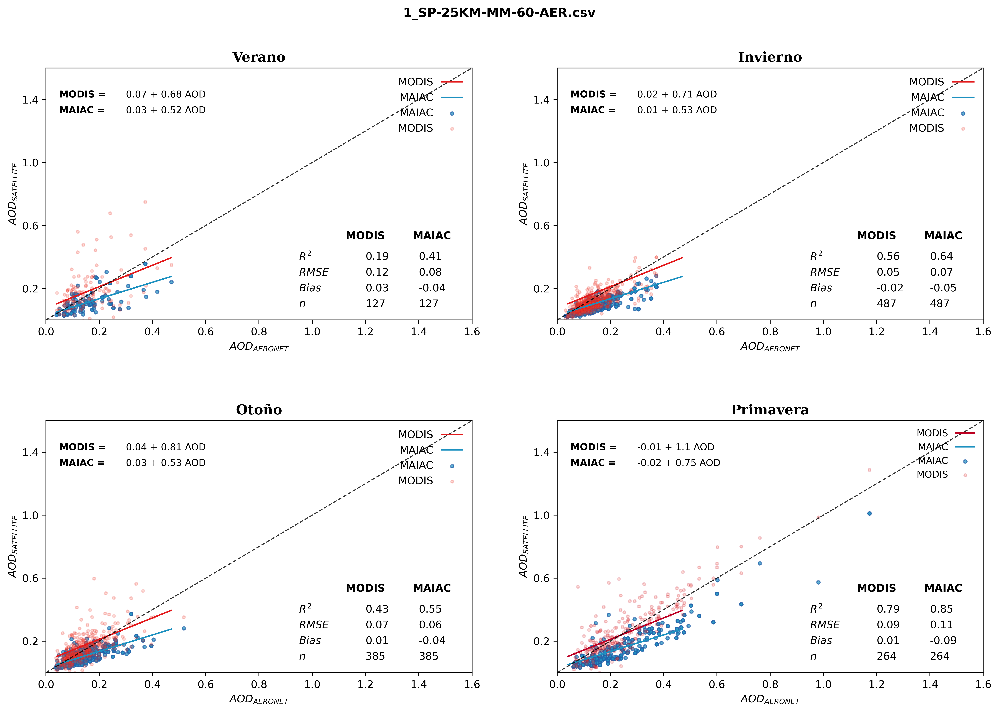

In [ ]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
#                                      SP
# =============================================================================
os.chdir('D:/Josefina/paper_git/paper_maiac/datasets/processed/MMA_v2/')
archivo = "1_SP-25KM-MM-60-AER.csv"
sp = pd.read_csv(archivo)
data_sp= pd.DataFrame(sp) 
data_sp = data_sp.dropna()
data_sp['Month'] = pd.DatetimeIndex(data_sp['date']).month #revisar porque me toma los datos del dia y nodel mes
#Creo columnas en los df
data_sp['season'] = None
n = len(data_sp)

for i in range(0,n): #Cambiar el numero de filas 
    if data_sp['Month'][i] == 12 or data_sp['Month'][i] == 1 or data_sp['Month'][i] == 2:
        data_sp['season'][i] = 1        
    elif data_sp['Month'][i] == 3 or data_sp['Month'][i] == 4 or data_sp['Month'][i]  == 5:
        data_sp['season'][i] = 2
    elif data_sp['Month'][i] == 6 or data_sp['Month'][i] == 7 or data_sp['Month'][i] == 8:
        data_sp['season'][i] = 3
    elif data_sp['Month'][i] == 9 or data_sp['Month'][i] == 10 or data_sp['Month'][i] == 11:
        data_sp['season'][i] = 4
#Separo las columnas por estación del año                    
v_data_sp = data_sp[data_sp['season'] == 1]
o_data_sp = data_sp[data_sp['season'] == 2]
i_data_sp = data_sp[data_sp['season'] == 3]
p_data_sp = data_sp[data_sp['season'] == 4]
#print(v_data_sp)

# PLOT

fig, ax = plt.subplots(ncols=2,nrows=2,  figsize=(16,10),dpi=500)
#The folder where the files of each station are located is browsed.


    ########################                VARIABLES                ########################
# ----------------VERANO
y_modis_v = v_data_sp ["AOD_550_MODIS_mean"]
y_maiac_v= v_data_sp["AOD_550_MAIAC_mean"]
x_v= v_data_sp["AOD_550_AER_mean"]
n_v = len(x_v)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_v , intercept_maiac_v , r_maiac_v , p_maiac_v , stderr_maiac_v  = scipy.stats.linregress(x_v , y_maiac_v)
slope_modis_v , intercept_modis_v , r_modis_v , p_modis_v , stderr_modis_v  = scipy.stats.linregress(x_v, y_modis_v)
# R2
R2_modis_v=r_modis_v*r_modis_v
R2_maiac_v=r_maiac_v*r_maiac_v
#Calculo RMSE
RMSE_modis_v = root_mean_squared_error(y_modis_v, x_v, squared = False)
RMSE_maiac_v = root_mean_squared_error(y_maiac_v, x_v, squared = False)
bias_modis_v = round(( sum(y_modis_v - x_v)/n_v),2)
bias_maiac_v = round(( sum(y_maiac_v - x_v)/n_v),2)

y_modis_rshp_v = v_data_sp ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_v= v_data_sp["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_v= v_data_sp["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_v = LinearRegression()
linear_regresion_maiac_v = LinearRegression()

linear_regresion_modis_v.fit(x_rshp_v,y_modis_rshp_v)
linear_regresion_maiac_v.fit(x_rshp_v,y_maiac_rshp_v)

li_predict_maiac_v = linear_regresion_maiac_v.predict(x_rshp_v)
li_predict_modis_v = linear_regresion_modis_v.predict(x_rshp_v)


# ---------------- INVIERNO
y_modis_i = i_data_sp ["AOD_550_MODIS_mean"]
y_maiac_i= i_data_sp["AOD_550_MAIAC_mean"]
x_i = i_data_sp["AOD_550_AER_mean"]
n_i = len(x_i)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_i , intercept_maiac_i , r_maiac_i , p_maiac_i , stderr_maiac_i  = scipy.stats.linregress(x_i , y_maiac_i)
slope_modis_i , intercept_modis_i , r_modis_i , p_modis_i , stderr_modis_i  = scipy.stats.linregress(x_i, y_modis_i)
# R2
R2_modis_i=r_modis_i*r_modis_i
R2_maiac_i=r_maiac_i*r_maiac_i
#Calculo RMSE
RMSE_modis_i = root_mean_squared_error(y_modis_i, x_i, squared = False)
RMSE_maiac_i = root_mean_squared_error(y_maiac_i, x_i, squared = False)
bias_modis_i = round(( sum(y_modis_i - x_i)/n_i),2)
bias_maiac_i = round(( sum(y_maiac_i - x_i)/n_i),2)
y_modis_rshp_i = v_data_sp ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_i= v_data_sp["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_i= v_data_sp["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_i = LinearRegression()
linear_regresion_maiac_i = LinearRegression()

linear_regresion_modis_i.fit(x_rshp_i,y_modis_rshp_i)
linear_regresion_maiac_i.fit(x_rshp_i,y_maiac_rshp_i)

li_predict_maiac_i = linear_regresion_maiac_i.predict(x_rshp_i)
li_predict_modis_i = linear_regresion_modis_i.predict(x_rshp_i)

# ---------------- OTOÑO
y_modis_o = o_data_sp ["AOD_550_MODIS_mean"]
y_maiac_o= o_data_sp["AOD_550_MAIAC_mean"]
x_o= o_data_sp["AOD_550_AER_mean"]
n_o = len(x_o)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_o , intercept_maiac_o , r_maiac_o , p_maiac_o , stderr_maiac_o  = scipy.stats.linregress(x_o , y_maiac_o)
slope_modis_o , intercept_modis_o , r_modis_o , p_modis_o , stderr_modis_o  = scipy.stats.linregress(x_o, y_modis_o)
# R2
R2_modis_o=r_modis_o*r_modis_o
R2_maiac_o=r_maiac_o*r_maiac_o
#Calculo RMSE
RMSE_modis_o = root_mean_squared_error(y_modis_o, x_o, squared = False)
RMSE_maiac_o = root_mean_squared_error(y_maiac_o, x_o, squared = False)
bias_modis_o = round(( sum(y_modis_o - x_o)/n_o),2)
bias_maiac_o = round(( sum(y_maiac_o - x_o)/n_o),2)
y_modis_rshp_o = v_data_sp ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_o= v_data_sp["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_o= v_data_sp["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_o = LinearRegression()
linear_regresion_maiac_o = LinearRegression()

linear_regresion_modis_o.fit(x_rshp_o,y_modis_rshp_o)
linear_regresion_maiac_o.fit(x_rshp_o,y_maiac_rshp_o)

li_predict_maiac_o = linear_regresion_maiac_o.predict(x_rshp_o)
li_predict_modis_o = linear_regresion_modis_o.predict(x_rshp_o)

# ---------------- PRIMAVERA
y_modis_p = p_data_sp ["AOD_550_MODIS_mean"]
y_maiac_p= p_data_sp["AOD_550_MAIAC_mean"]
x_p= p_data_sp["AOD_550_AER_mean"]
n_p = len(x_p)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_p , intercept_maiac_p , r_maiac_p , p_maiac_p , stderr_maiac_p  = scipy.stats.linregress(x_p , y_maiac_p)
slope_modis_p , intercept_modis_p , r_modis_p , p_modis_p , stderr_modis_p  = scipy.stats.linregress(x_p, y_modis_p)
# R2
R2_modis_p=r_modis_p*r_modis_p
R2_maiac_p=r_maiac_p*r_maiac_p
#Calculo RMSE
RMSE_modis_p = root_mean_squared_error(y_modis_p, x_p, squared = False)
RMSE_maiac_p = root_mean_squared_error(y_maiac_p, x_p, squared = False)
bias_modis_p = round(( sum(y_modis_p - x_p)/n_p),2)
bias_maiac_p = round(( sum(y_maiac_p - x_p)/n_p),2)
y_modis_rshp_p = v_data_sp ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_p= v_data_sp["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_p= v_data_sp["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_p = LinearRegression()
linear_regresion_maiac_p = LinearRegression()

linear_regresion_modis_p.fit(x_rshp_p,y_modis_rshp_p)
linear_regresion_maiac_p.fit(x_rshp_p,y_maiac_rshp_p)

li_predict_maiac_p = linear_regresion_maiac_p.predict(x_rshp_p)
li_predict_modis_p = linear_regresion_modis_p.predict(x_rshp_p)



########################                PLOT    VERANO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][0].scatter(x_v, y_maiac_v,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][0].scatter(x_v, y_modis_v,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][0].plot(x_rshp_v,li_predict_modis_v,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][0].plot(x_rshp_v,li_predict_maiac_v,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")
#add the line 1:1
ax[0][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][0].set_xlim(0, 1.6)
ax[0][0].set_ylim(0, 1.6)

## Linear regression equation
ax[0][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][0].text(0.3, 1.4, (str(round (intercept_modis_v,2)) + " + "+ str(round (slope_modis_v,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][0].text(0.3, 1.3, (str(round (intercept_maiac_v,2)) + " + "+ str(round (slope_maiac_v,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[0][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[0][0].text(1.20, 0.4,(round(R2_modis_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.20, 0.30,  (round(RMSE_modis_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.20, 0.2, (round(bias_modis_v,2)) , fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.20, 0.1, n_v , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[0][0].text(1.40, 0.4,(round(R2_maiac_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.40, 0.30,   (round(RMSE_maiac_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.40, 0.2,  bias_maiac_v, fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.40, 0.1,  n_v , fontsize=10,ha="left", va="center")

# Title of each subplot corresponds to the name of the AERONET station.
ax[0][0].set_title("Verano",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend

ax[0][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
# Configuration of subplots
plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)

########################                PLOT    INVIERNO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][1].scatter(x_i, y_maiac_i, c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][1].scatter(x_i, y_modis_i,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][1].plot(x_rshp_i,li_predict_modis_i,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][1].plot(x_rshp_i,li_predict_maiac_i,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[0][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][1].set_xlim(0, 1.6)
ax[0][1].set_ylim(0, 1.6)

## Linear regression equation
ax[0][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][1].text(0.3, 1.4, (str(round (intercept_modis_i,2)) + " + "+ str(round (slope_modis_i,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][1].text(0.3, 1.3, (str(round (intercept_maiac_i,2)) + " + "+ str(round (slope_maiac_i,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[0][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[0][1].text(1.20, 0.4,(round(R2_modis_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.20, 0.30,  (round(RMSE_modis_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.20, 0.2, (round(bias_modis_i,2)) , fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.20, 0.1, n_i , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[0][1].text(1.40, 0.4,(round(R2_maiac_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.40, 0.30,   (round(RMSE_maiac_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.40, 0.2,  bias_maiac_i, fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.40, 0.1,  n_i , fontsize=10,ha="left", va="center")

# Title of each subplot corresponds to the name of the AERONET station.
ax[0][1].set_title("Invierno",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[0][1].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    OTOÑO           ########################
# Figure

#Scatter plot Unit vs Ref
ax[1][0].scatter(x_o, y_maiac_o,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][0].scatter(x_o, y_modis_o,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[1][0].plot(x_rshp_o,li_predict_modis_o,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][0].plot(x_rshp_o,li_predict_maiac_o,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][0].set_xlim(0, 1.6)
ax[1][0].set_ylim(0, 1.6)

## Linear regression equation
ax[1][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][0].text(0.3, 1.4, (str(round (intercept_modis_o,2)) + " + "+ str(round (slope_modis_o,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][0].text(0.3, 1.3, (str(round (intercept_maiac_o,2)) + " + "+ str(round (slope_maiac_o,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[1][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[1][0].text(1.20, 0.4,(round(R2_modis_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.20, 0.30,  (round(RMSE_modis_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.20, 0.2, (round(bias_modis_o,2)) , fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.20, 0.1, n_o , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[1][0].text(1.40, 0.4,(round(R2_maiac_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.40, 0.30,   (round(RMSE_maiac_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.40, 0.2,  bias_maiac_o, fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.40, 0.1,  n_o , fontsize=10,ha="left", va="center")

# Title of each subplot corresponds to the name of the AERONET station.
ax[1][0].set_title("Otoño",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    PRIMAVERA          ########################
# Figure
#Scatter plot Unit vs Ref
ax[1][1].scatter(x_p, y_maiac_p,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][1].scatter(x_p, y_modis_p,  c="#fc4e2a" ,edgecolors="#bd0026",alpha=0.2,  s=7,label = "MODIS")


ax[1][1].plot(x_rshp_p,li_predict_modis_p,c="#bd0026",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][1].plot(x_rshp_p,li_predict_maiac_p,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][1].set_xlim(0, 1.6)
ax[1][1].set_ylim(0, 1.6)

## Linear regression equation
ax[1][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][1].text(0.3, 1.4, (str(round (intercept_modis_p,2)) + " + "+ str(round (slope_modis_p,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][1].text(0.3, 1.3, (str(round (intercept_maiac_p,2)) + " + "+ str(round (slope_maiac_p,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[1][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[1][1].text(1.20, 0.4,(round(R2_modis_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.20, 0.30,  (round(RMSE_modis_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.20, 0.2, (round(bias_modis_p,2)) , fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.20, 0.1, n_p , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[1][1].text(1.40, 0.4,(round(R2_maiac_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.40, 0.30,   (round(RMSE_maiac_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.40, 0.2,  bias_maiac_p, fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.40, 0.1,  n_p , fontsize=10,ha="left", va="center")

# Title of each subplot corresponds to the name of the AERONET station.
ax[1][1].set_title("Primavera",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][1].legend( frameon = False, markerfirst = False, fontsize = 9,loc='upper right')
# Axes names
ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
fig.suptitle(archivo,fontsize=12,fontweight ="bold")
nombre = archivo[0:20]+"_reg.png"
plt.savefig(nombre, dpi=500)

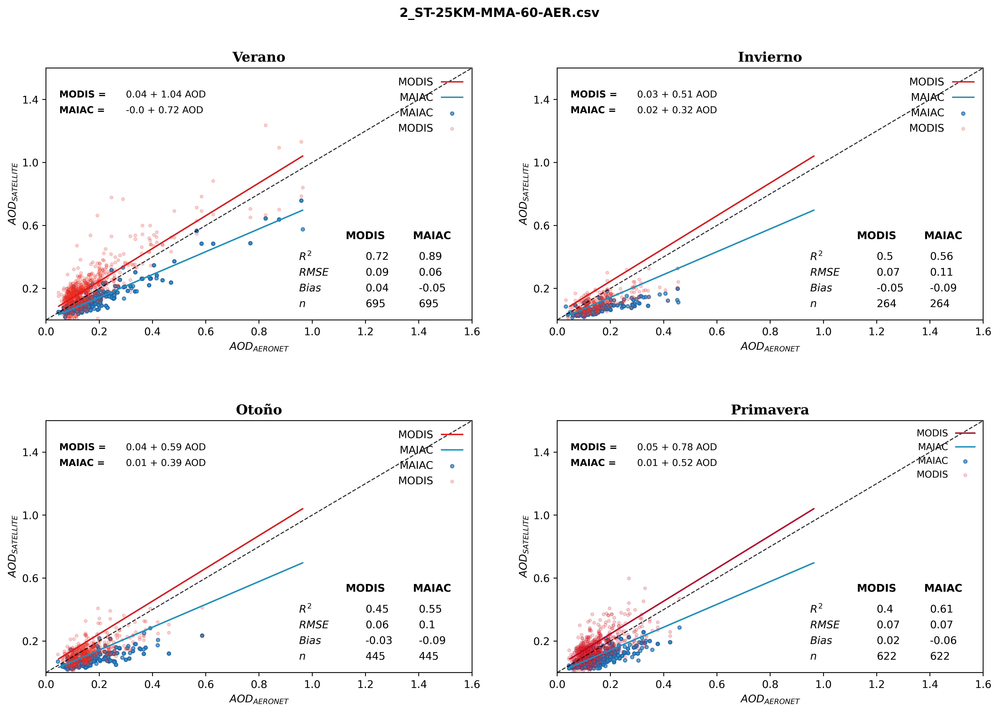

In [ ]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
#                                      SANTIAGO
# =============================================================================
os.chdir('D:/Josefina/paper_git/paper_maiac/datasets/processed/MMA_v2/')
archivo = "2_ST-25KM-MMA-60-AER.csv"
st = pd.read_csv(archivo)
data_st= pd.DataFrame(st) 
data_st = data_st.dropna()
data_st['Month'] = pd.DatetimeIndex(data_st['date']).month #revisar porque me toma los datos del dia y nodel mes
#Creo columnas en los df
data_st['season'] = None
n = len(data_st)

for i in range(0,n): #Cambiar el numero de filas 
    if data_st['Month'][i] == 12 or data_st['Month'][i] == 1 or data_st['Month'][i] == 2:
        data_st['season'][i] = 1        
    elif data_st['Month'][i] == 3 or data_st['Month'][i] == 4 or data_st['Month'][i]  == 5:
        data_st['season'][i] = 2
    elif data_st['Month'][i] == 6 or data_st['Month'][i] == 7 or data_st['Month'][i] == 8:
        data_st['season'][i] = 3
    elif data_st['Month'][i] == 9 or data_st['Month'][i] == 10 or data_st['Month'][i] == 11:
        data_st['season'][i] = 4
#Separo las columnas por estación del año                    
v_data_st = data_st[data_st['season'] == 1]
o_data_st = data_st[data_st['season'] == 2]
i_data_st = data_st[data_st['season'] == 3]
p_data_st = data_st[data_st['season'] == 4]
#print(v_data_st)

# PLOT

fig, ax = plt.subplots(ncols=2,nrows=2,  figsize=(16,10),dpi=500)
#The folder where the files of each station are located is browsed.


    ########################                VARIABLES                ########################
# ----------------VERANO
y_modis_v = v_data_st ["AOD_550_MODIS_mean"]
y_maiac_v= v_data_st["AOD_550_MAIAC_mean"]
x_v= v_data_st["AOD_550_AER_mean"]
n_v = len(x_v)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_v , intercept_maiac_v , r_maiac_v , p_maiac_v , stderr_maiac_v  = scipy.stats.linregress(x_v , y_maiac_v)
slope_modis_v , intercept_modis_v , r_modis_v , p_modis_v , stderr_modis_v  = scipy.stats.linregress(x_v, y_modis_v)
# R2
R2_modis_v=r_modis_v*r_modis_v
R2_maiac_v=r_maiac_v*r_maiac_v
#Calculo RMSE
RMSE_modis_v = root_mean_squared_error(y_modis_v, x_v)
RMSE_maiac_v = root_mean_squared_error(y_maiac_v, x_v)
bias_modis_v = round(( sum(y_modis_v - x_v)/n_v),2)
bias_maiac_v = round(( sum(y_maiac_v - x_v)/n_v),2)

y_modis_rshp_v = v_data_st ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_v= v_data_st["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_v= v_data_st["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_v = LinearRegression()
linear_regresion_maiac_v = LinearRegression()

linear_regresion_modis_v.fit(x_rshp_v,y_modis_rshp_v)
linear_regresion_maiac_v.fit(x_rshp_v,y_maiac_rshp_v)

li_predict_maiac_v = linear_regresion_maiac_v.predict(x_rshp_v)
li_predict_modis_v = linear_regresion_modis_v.predict(x_rshp_v)


# ---------------- INVIERNO
y_modis_i = i_data_st ["AOD_550_MODIS_mean"]
y_maiac_i= i_data_st["AOD_550_MAIAC_mean"]
x_i = i_data_st["AOD_550_AER_mean"]
n_i = len(x_i)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_i , intercept_maiac_i , r_maiac_i , p_maiac_i , stderr_maiac_i  = scipy.stats.linregress(x_i , y_maiac_i)
slope_modis_i , intercept_modis_i , r_modis_i , p_modis_i , stderr_modis_i  = scipy.stats.linregress(x_i, y_modis_i)
# R2
R2_modis_i=r_modis_i*r_modis_i
R2_maiac_i=r_maiac_i*r_maiac_i
#Calculo RMSE
RMSE_modis_i = root_mean_squared_error(y_modis_i, x_i)
RMSE_maiac_i = root_mean_squared_error(y_maiac_i, x_i)
bias_modis_i = round(( sum(y_modis_i - x_i)/n_i),2)
bias_maiac_i = round(( sum(y_maiac_i - x_i)/n_i),2)
y_modis_rshp_i = v_data_st ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_i= v_data_st["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_i= v_data_st["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_i = LinearRegression()
linear_regresion_maiac_i = LinearRegression()

linear_regresion_modis_i.fit(x_rshp_i,y_modis_rshp_i)
linear_regresion_maiac_i.fit(x_rshp_i,y_maiac_rshp_i)

li_predict_maiac_i = linear_regresion_maiac_i.predict(x_rshp_i)
li_predict_modis_i = linear_regresion_modis_i.predict(x_rshp_i)

# ---------------- OTOÑO
y_modis_o = o_data_st ["AOD_550_MODIS_mean"]
y_maiac_o= o_data_st["AOD_550_MAIAC_mean"]
x_o= o_data_st["AOD_550_AER_mean"]
n_o = len(x_o)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_o , intercept_maiac_o , r_maiac_o , p_maiac_o , stderr_maiac_o  = scipy.stats.linregress(x_o , y_maiac_o)
slope_modis_o , intercept_modis_o , r_modis_o , p_modis_o , stderr_modis_o  = scipy.stats.linregress(x_o, y_modis_o)
# R2
R2_modis_o=r_modis_o*r_modis_o
R2_maiac_o=r_maiac_o*r_maiac_o
#Calculo RMSE
RMSE_modis_o = root_mean_squared_error(y_modis_o, x_o)
RMSE_maiac_o = root_mean_squared_error(y_maiac_o, x_o)
bias_modis_o = round(( sum(y_modis_o - x_o)/n_o),2)
bias_maiac_o = round(( sum(y_maiac_o - x_o)/n_o),2)
y_modis_rshp_o = v_data_st ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_o= v_data_st["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_o= v_data_st["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_o = LinearRegression()
linear_regresion_maiac_o = LinearRegression()

linear_regresion_modis_o.fit(x_rshp_o,y_modis_rshp_o)
linear_regresion_maiac_o.fit(x_rshp_o,y_maiac_rshp_o)

li_predict_maiac_o = linear_regresion_maiac_o.predict(x_rshp_o)
li_predict_modis_o = linear_regresion_modis_o.predict(x_rshp_o)

# ---------------- PRIMAVERA
y_modis_p = p_data_st ["AOD_550_MODIS_mean"]
y_maiac_p= p_data_st["AOD_550_MAIAC_mean"]
x_p= p_data_st["AOD_550_AER_mean"]
n_p = len(x_p)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_p , intercept_maiac_p , r_maiac_p , p_maiac_p , stderr_maiac_p  = scipy.stats.linregress(x_p , y_maiac_p)
slope_modis_p , intercept_modis_p , r_modis_p , p_modis_p , stderr_modis_p  = scipy.stats.linregress(x_p, y_modis_p)
# R2
R2_modis_p=r_modis_p*r_modis_p
R2_maiac_p=r_maiac_p*r_maiac_p
#Calculo RMSE
RMSE_modis_p = root_mean_squared_error(y_modis_p, x_p)
RMSE_maiac_p = root_mean_squared_error(y_maiac_p, x_p)
bias_modis_p = round(( sum(y_modis_p - x_p)/n_p),2)
bias_maiac_p = round(( sum(y_maiac_p - x_p)/n_p),2)
y_modis_rshp_p = v_data_st ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_p= v_data_st["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_p= v_data_st["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_p = LinearRegression()
linear_regresion_maiac_p = LinearRegression()

linear_regresion_modis_p.fit(x_rshp_p,y_modis_rshp_p)
linear_regresion_maiac_p.fit(x_rshp_p,y_maiac_rshp_p)

li_predict_maiac_p = linear_regresion_maiac_p.predict(x_rshp_p)
li_predict_modis_p = linear_regresion_modis_p.predict(x_rshp_p)



########################                PLOT    VERANO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][0].scatter(x_v, y_maiac_v,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][0].scatter(x_v, y_modis_v,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][0].plot(x_rshp_v,li_predict_modis_v,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][0].plot(x_rshp_v,li_predict_maiac_v,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")
#add the line 1:1
ax[0][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][0].set_xlim(0, 1.6)
ax[0][0].set_ylim(0, 1.6)

## Linear regression equation
ax[0][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][0].text(0.3, 1.4, (str(round (intercept_modis_v,2)) + " + "+ str(round (slope_modis_v,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][0].text(0.3, 1.3, (str(round (intercept_maiac_v,2)) + " + "+ str(round (slope_maiac_v,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[0][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[0][0].text(1.20, 0.4,(round(R2_modis_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.20, 0.30,  (round(RMSE_modis_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.20, 0.2, (round(bias_modis_v,2)) , fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.20, 0.1, n_v , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[0][0].text(1.40, 0.4,(round(R2_maiac_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.40, 0.30,   (round(RMSE_maiac_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.40, 0.2,  bias_maiac_v, fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.40, 0.1,  n_v , fontsize=10,ha="left", va="center")

# Title of each subplot correstonds to the name of the AERONET station.
ax[0][0].set_title("Verano",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend

ax[0][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
# Configuration of subplots

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)

########################                PLOT    INVIERNO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][1].scatter(x_i, y_maiac_i, c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][1].scatter(x_i, y_modis_i,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][1].plot(x_rshp_i,li_predict_modis_i,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][1].plot(x_rshp_i,li_predict_maiac_i,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[0][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][1].set_xlim(0, 1.6)
ax[0][1].set_ylim(0, 1.6)

## Linear regression equation
ax[0][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][1].text(0.3, 1.4, (str(round (intercept_modis_i,2)) + " + "+ str(round (slope_modis_i,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][1].text(0.3, 1.3, (str(round (intercept_maiac_i,2)) + " + "+ str(round (slope_maiac_i,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[0][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[0][1].text(1.20, 0.4,(round(R2_modis_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.20, 0.30,  (round(RMSE_modis_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.20, 0.2, (round(bias_modis_i,2)) , fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.20, 0.1, n_i , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[0][1].text(1.40, 0.4,(round(R2_maiac_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.40, 0.30,   (round(RMSE_maiac_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.40, 0.2,  bias_maiac_i, fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.40, 0.1,  n_i , fontsize=10,ha="left", va="center")

# Title of each subplot correstonds to the name of the AERONET station.
ax[0][1].set_title("Invierno",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[0][1].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    OTOÑO           ########################
# Figure

#Scatter plot Unit vs Ref
ax[1][0].scatter(x_o, y_maiac_o,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][0].scatter(x_o, y_modis_o,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[1][0].plot(x_rshp_o,li_predict_modis_o,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][0].plot(x_rshp_o,li_predict_maiac_o,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][0].set_xlim(0, 1.6)
ax[1][0].set_ylim(0, 1.6)

## Linear regression equation
ax[1][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][0].text(0.3, 1.4, (str(round (intercept_modis_o,2)) + " + "+ str(round (slope_modis_o,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][0].text(0.3, 1.3, (str(round (intercept_maiac_o,2)) + " + "+ str(round (slope_maiac_o,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[1][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[1][0].text(1.20, 0.4,(round(R2_modis_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.20, 0.30,  (round(RMSE_modis_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.20, 0.2, (round(bias_modis_o,2)) , fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.20, 0.1, n_o , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[1][0].text(1.40, 0.4,(round(R2_maiac_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.40, 0.30,   (round(RMSE_maiac_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.40, 0.2,  bias_maiac_o, fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.40, 0.1,  n_o , fontsize=10,ha="left", va="center")

# Title of each subplot correstonds to the name of the AERONET station.
ax[1][0].set_title("Otoño",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    PRIMAVERA          ########################
# Figure
#Scatter plot Unit vs Ref
ax[1][1].scatter(x_p, y_maiac_p,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][1].scatter(x_p, y_modis_p,  c="#fc4e2a" ,edgecolors="#bd0026",alpha=0.2,  s=7,label = "MODIS")


ax[1][1].plot(x_rshp_p,li_predict_modis_p,c="#bd0026",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][1].plot(x_rshp_p,li_predict_maiac_p,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][1].set_xlim(0, 1.6)
ax[1][1].set_ylim(0, 1.6)

## Linear regression equation
ax[1][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][1].text(0.3, 1.4, (str(round (intercept_modis_p,2)) + " + "+ str(round (slope_modis_p,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][1].text(0.3, 1.3, (str(round (intercept_maiac_p,2)) + " + "+ str(round (slope_maiac_p,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxstyle="round", fc=(1.0, 0.99, 0.99)))

# Statistics by station
ax[1][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#Statistics by station for MODIS
ax[1][1].text(1.20, 0.4,(round(R2_modis_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.20, 0.30,  (round(RMSE_modis_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.20, 0.2, (round(bias_modis_p,2)) , fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.20, 0.1, n_p , fontsize=10,ha="left", va="center")

# Statistics by station for  MAIAC
ax[1][1].text(1.40, 0.4,(round(R2_maiac_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.40, 0.30,   (round(RMSE_maiac_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.40, 0.2,  bias_maiac_p, fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.40, 0.1,  n_p , fontsize=10,ha="left", va="center")

# Title of each subplot correstonds to the name of the AERONET station.
ax[1][1].set_title("Primavera",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][1].legend( frameon = False, markerfirst = False, fontsize = 9,loc='upper right')
# Axes names
ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
fig.suptitle(archivo,fontsize=12,fontweight ="bold")
nombre = archivo[0:20]+"_reg.png"
plt.savefig(nombre, dpi=500)

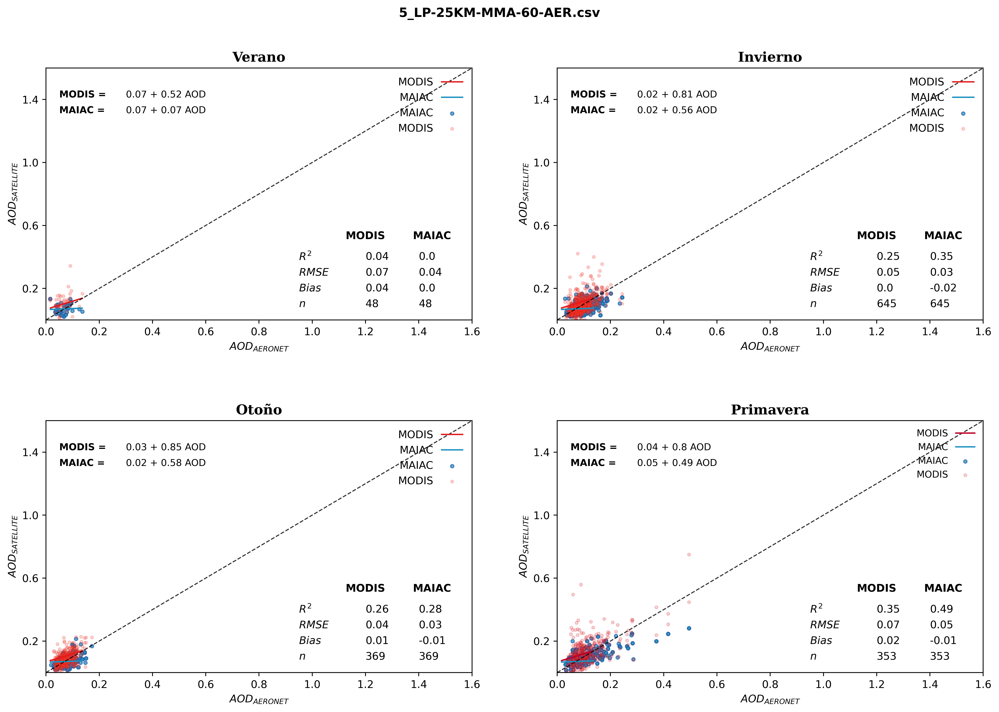

In [ ]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
#                                     LA PAZ
# =============================================================================
os.chdir('D:/Josefina/paper_git/paper_maiac/datasets/processed/MMA_v2/')
archivo = "5_LP-25KM-MMA-60-AER.csv"
lp = pd.read_csv(archivo)
data_lp= pd.DataFrame(lp) 
data_lp = data_lp.dropna()
data_lp['Month'] = pd.DatetimeIndex(data_lp['date']).month #revisar porque me toma los datos del dia y nodel mes
#Creo columnas en los df
data_lp['season'] = None
n = len(data_lp)

for i in range(0,n): #Cambiar el numero de filas 
    if data_lp['Month'][i] == 12 or data_lp['Month'][i] == 1 or data_lp['Month'][i] == 2:
        data_lp['season'][i] = 1        
    elif data_lp['Month'][i] == 3 or data_lp['Month'][i] == 4 or data_lp['Month'][i]  == 5:
        data_lp['season'][i] = 2
    elif data_lp['Month'][i] == 6 or data_lp['Month'][i] == 7 or data_lp['Month'][i] == 8:
        data_lp['season'][i] = 3
    elif data_lp['Month'][i] == 9 or data_lp['Month'][i] == 10 or data_lp['Month'][i] == 11:
        data_lp['season'][i] = 4
#Separo las columnas por elpación del año                    
v_data_lp = data_lp[data_lp['season'] == 1]
o_data_lp = data_lp[data_lp['season'] == 2]
i_data_lp = data_lp[data_lp['season'] == 3]
p_data_lp = data_lp[data_lp['season'] == 4]
#print(v_data_lp)

# PLOT

fig, ax = plt.subplots(ncols=2,nrows=2,  figsize=(16,10),dpi=500)
#The folder where the files of each lpation are located is browsed.


    ########################                VARIABLES                ########################
# ----------------VERANO
y_modis_v = v_data_lp ["AOD_550_MODIS_mean"]
y_maiac_v= v_data_lp["AOD_550_MAIAC_mean"]
x_v= v_data_lp["AOD_550_AER_mean"]
n_v = len(x_v)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_v , intercept_maiac_v , r_maiac_v , p_maiac_v , stderr_maiac_v  = scipy.stats.linregress(x_v , y_maiac_v)
slope_modis_v , intercept_modis_v , r_modis_v , p_modis_v , stderr_modis_v  = scipy.stats.linregress(x_v, y_modis_v)

# R2
R2_modis_v=r_modis_v*r_modis_v
R2_maiac_v=r_maiac_v*r_maiac_v
#Calculo RMSE
RMSE_modis_v = root_mean_squared_error(y_modis_v, x_v)
RMSE_maiac_v = root_mean_squared_error(y_maiac_v, x_v)
bias_modis_v = round(( sum(y_modis_v - x_v)/n_v),2)
bias_maiac_v = round(( sum(y_maiac_v - x_v)/n_v),2)

y_modis_rshp_v = v_data_lp ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_v= v_data_lp["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_v= v_data_lp["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_v = LinearRegression()
linear_regresion_maiac_v = LinearRegression()

linear_regresion_modis_v.fit(x_rshp_v,y_modis_rshp_v)
linear_regresion_maiac_v.fit(x_rshp_v,y_maiac_rshp_v)

li_predict_maiac_v = linear_regresion_maiac_v.predict(x_rshp_v)
li_predict_modis_v = linear_regresion_modis_v.predict(x_rshp_v)


# ---------------- INVIERNO
y_modis_i = i_data_lp ["AOD_550_MODIS_mean"]
y_maiac_i= i_data_lp["AOD_550_MAIAC_mean"]
x_i = i_data_lp["AOD_550_AER_mean"]
n_i = len(x_i)
#Calculo la pendiente, la ordenada al origen y el R2

slope_maiac_i , intercept_maiac_i , r_maiac_i , p_maiac_i , stderr_maiac_i  = scipy.stats.linregress(x_i , y_maiac_i)
slope_modis_i , intercept_modis_i , r_modis_i , p_modis_i , stderr_modis_i  = scipy.stats.linregress(x_i, y_modis_i)
# R2
R2_modis_i=r_modis_i*r_modis_i
R2_maiac_i=r_maiac_i*r_maiac_i
#Calculo RMSE
RMSE_modis_i = mean_squared_error(y_modis_i, x_i, squared = False)
RMSE_maiac_i = mean_squared_error(y_maiac_i, x_i, squared = False)
bias_modis_i = round(( sum(y_modis_i - x_i)/n_i),2)
bias_maiac_i = round(( sum(y_maiac_i - x_i)/n_i),2)
y_modis_rshp_i = v_data_lp ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_i= v_data_lp["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_i= v_data_lp["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_i = LinearRegression()
linear_regresion_maiac_i = LinearRegression()

linear_regresion_modis_i.fit(x_rshp_i,y_modis_rshp_i)
linear_regresion_maiac_i.fit(x_rshp_i,y_maiac_rshp_i)

li_predict_maiac_i = linear_regresion_maiac_i.predict(x_rshp_i)
li_predict_modis_i = linear_regresion_modis_i.predict(x_rshp_i)

# ---------------- OTOÑO
y_modis_o = o_data_lp ["AOD_550_MODIS_mean"]
y_maiac_o= o_data_lp["AOD_550_MAIAC_mean"]
x_o= o_data_lp["AOD_550_AER_mean"]
n_o = len(x_o)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_o , intercept_maiac_o , r_maiac_o , p_maiac_o , stderr_maiac_o  = scipy.stats.linregress(x_o , y_maiac_o)
slope_modis_o , intercept_modis_o , r_modis_o , p_modis_o , stderr_modis_o  = scipy.stats.linregress(x_o, y_modis_o)
# R2
R2_modis_o=r_modis_o*r_modis_o
R2_maiac_o=r_maiac_o*r_maiac_o
#Calculo RMSE
RMSE_modis_o = mean_squared_error(y_modis_o, x_o, squared = False)
RMSE_maiac_o = mean_squared_error(y_maiac_o, x_o, squared = False)
bias_modis_o = round(( sum(y_modis_o - x_o)/n_o),2)
bias_maiac_o = round(( sum(y_maiac_o - x_o)/n_o),2)
y_modis_rshp_o = v_data_lp ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_o= v_data_lp["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_o= v_data_lp["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_o = LinearRegression()
linear_regresion_maiac_o = LinearRegression()

linear_regresion_modis_o.fit(x_rshp_o,y_modis_rshp_o)
linear_regresion_maiac_o.fit(x_rshp_o,y_maiac_rshp_o)

li_predict_maiac_o = linear_regresion_maiac_o.predict(x_rshp_o)
li_predict_modis_o = linear_regresion_modis_o.predict(x_rshp_o)

# ---------------- PRIMAVERA
y_modis_p = p_data_lp ["AOD_550_MODIS_mean"]
y_maiac_p= p_data_lp["AOD_550_MAIAC_mean"]
x_p= p_data_lp["AOD_550_AER_mean"]
n_p = len(x_p)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_p , intercept_maiac_p , r_maiac_p , p_maiac_p , stderr_maiac_p  = scipy.stats.linregress(x_p , y_maiac_p)
slope_modis_p , intercept_modis_p , r_modis_p , p_modis_p , stderr_modis_p  = scipy.stats.linregress(x_p, y_modis_p)
# R2
R2_modis_p=r_modis_p*r_modis_p
R2_maiac_p=r_maiac_p*r_maiac_p
#Calculo RMSE
RMSE_modis_p = mean_squared_error(y_modis_p, x_p, squared = False)
RMSE_maiac_p = mean_squared_error(y_maiac_p, x_p, squared = False)
bias_modis_p = round(( sum(y_modis_p - x_p)/n_p),2)
bias_maiac_p = round(( sum(y_maiac_p - x_p)/n_p),2)
y_modis_rshp_p = v_data_lp ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_p= v_data_lp["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_p= v_data_lp["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_p = LinearRegression()
linear_regresion_maiac_p = LinearRegression()

linear_regresion_modis_p.fit(x_rshp_p,y_modis_rshp_p)
linear_regresion_maiac_p.fit(x_rshp_p,y_maiac_rshp_p)

li_predict_maiac_p = linear_regresion_maiac_p.predict(x_rshp_p)
li_predict_modis_p = linear_regresion_modis_p.predict(x_rshp_p)



########################                PLOT    VERANO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][0].scatter(x_v, y_maiac_v,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][0].scatter(x_v, y_modis_v,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][0].plot(x_rshp_v,li_predict_modis_v,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][0].plot(x_rshp_v,li_predict_maiac_v,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")
#add the line 1:1
ax[0][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][0].set_xlim(0, 1.6)
ax[0][0].set_ylim(0, 1.6)

## Linear regression equation
ax[0][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][0].text(0.3, 1.4, (str(round (intercept_modis_v,2)) + " + "+ str(round (slope_modis_v,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxlpyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][0].text(0.3, 1.3, (str(round (intercept_maiac_v,2)) + " + "+ str(round (slope_maiac_v,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxlpyle="round", fc=(1.0, 0.99, 0.99)))

# lpatilpics by lpation
ax[0][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#lpatilpics by lpation for MODIS
ax[0][0].text(1.20, 0.4,(round(R2_modis_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.20, 0.30,  (round(RMSE_modis_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.20, 0.2, (round(bias_modis_v,2)) , fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.20, 0.1, n_v , fontsize=10,ha="left", va="center")

# lpatilpics by lpation for  MAIAC
ax[0][0].text(1.40, 0.4,(round(R2_maiac_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.40, 0.30,   (round(RMSE_maiac_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.40, 0.2,  bias_maiac_v, fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.40, 0.1,  n_v , fontsize=10,ha="left", va="center")

# Title of each subplot correlponds to the name of the AERONET lpation.
ax[0][0].set_title("Verano",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend

ax[0][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
# Configuration of subplots

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)

########################                PLOT    INVIERNO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][1].scatter(x_i, y_maiac_i, c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][1].scatter(x_i, y_modis_i,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][1].plot(x_rshp_i,li_predict_modis_i,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][1].plot(x_rshp_i,li_predict_maiac_i,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[0][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][1].set_xlim(0, 1.6)
ax[0][1].set_ylim(0, 1.6)

## Linear regression equation
ax[0][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][1].text(0.3, 1.4, (str(round (intercept_modis_i,2)) + " + "+ str(round (slope_modis_i,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxlpyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][1].text(0.3, 1.3, (str(round (intercept_maiac_i,2)) + " + "+ str(round (slope_maiac_i,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxlpyle="round", fc=(1.0, 0.99, 0.99)))

# lpatilpics by lpation
ax[0][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#lpatilpics by lpation for MODIS
ax[0][1].text(1.20, 0.4,(round(R2_modis_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.20, 0.30,  (round(RMSE_modis_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.20, 0.2, (round(bias_modis_i,2)) , fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.20, 0.1, n_i , fontsize=10,ha="left", va="center")

# lpatilpics by lpation for  MAIAC
ax[0][1].text(1.40, 0.4,(round(R2_maiac_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.40, 0.30,   (round(RMSE_maiac_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.40, 0.2,  bias_maiac_i, fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.40, 0.1,  n_i , fontsize=10,ha="left", va="center")

# Title of each subplot correlponds to the name of the AERONET lpation.
ax[0][1].set_title("Invierno",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[0][1].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    OTOÑO           ########################
# Figure

#Scatter plot Unit vs Ref
ax[1][0].scatter(x_o, y_maiac_o,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][0].scatter(x_o, y_modis_o,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[1][0].plot(x_rshp_o,li_predict_modis_o,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][0].plot(x_rshp_o,li_predict_maiac_o,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][0].set_xlim(0, 1.6)
ax[1][0].set_ylim(0, 1.6)

## Linear regression equation
ax[1][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][0].text(0.3, 1.4, (str(round (intercept_modis_o,2)) + " + "+ str(round (slope_modis_o,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxlpyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][0].text(0.3, 1.3, (str(round (intercept_maiac_o,2)) + " + "+ str(round (slope_maiac_o,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxlpyle="round", fc=(1.0, 0.99, 0.99)))

# lpatilpics by lpation
ax[1][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#lpatilpics by lpation for MODIS
ax[1][0].text(1.20, 0.4,(round(R2_modis_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.20, 0.30,  (round(RMSE_modis_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.20, 0.2, (round(bias_modis_o,2)) , fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.20, 0.1, n_o , fontsize=10,ha="left", va="center")

# lpatilpics by lpation for  MAIAC
ax[1][0].text(1.40, 0.4,(round(R2_maiac_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.40, 0.30,   (round(RMSE_maiac_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.40, 0.2,  bias_maiac_o, fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.40, 0.1,  n_o , fontsize=10,ha="left", va="center")

# Title of each subplot correlponds to the name of the AERONET lpation.
ax[1][0].set_title("Otoño",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    PRIMAVERA          ########################
# Figure
#Scatter plot Unit vs Ref
ax[1][1].scatter(x_p, y_maiac_p,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][1].scatter(x_p, y_modis_p,  c="#fc4e2a" ,edgecolors="#bd0026",alpha=0.2,  s=7,label = "MODIS")


ax[1][1].plot(x_rshp_p,li_predict_modis_p,c="#bd0026",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][1].plot(x_rshp_p,li_predict_maiac_p,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][1].set_xlim(0, 1.6)
ax[1][1].set_ylim(0, 1.6)

## Linear regression equation
ax[1][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][1].text(0.3, 1.4, (str(round (intercept_modis_p,2)) + " + "+ str(round (slope_modis_p,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxlpyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][1].text(0.3, 1.3, (str(round (intercept_maiac_p,2)) + " + "+ str(round (slope_maiac_p,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxlpyle="round", fc=(1.0, 0.99, 0.99)))

# lpatilpics by lpation
ax[1][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#lpatilpics by lpation for MODIS
ax[1][1].text(1.20, 0.4,(round(R2_modis_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.20, 0.30,  (round(RMSE_modis_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.20, 0.2, (round(bias_modis_p,2)) , fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.20, 0.1, n_p , fontsize=10,ha="left", va="center")

# lpatilpics by lpation for  MAIAC
ax[1][1].text(1.40, 0.4,(round(R2_maiac_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.40, 0.30,   (round(RMSE_maiac_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.40, 0.2,  bias_maiac_p, fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.40, 0.1,  n_p , fontsize=10,ha="left", va="center")

# Title of each subplot correlponds to the name of the AERONET lpation.
ax[1][1].set_title("Primavera",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][1].legend( frameon = False, markerfirst = False, fontsize = 9,loc='upper right')
# Axes names
ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
fig.suptitle(archivo,fontsize=12,fontweight ="bold")
nombre = archivo[0:20]+"_reg.png"
plt.savefig(nombre, dpi=500)

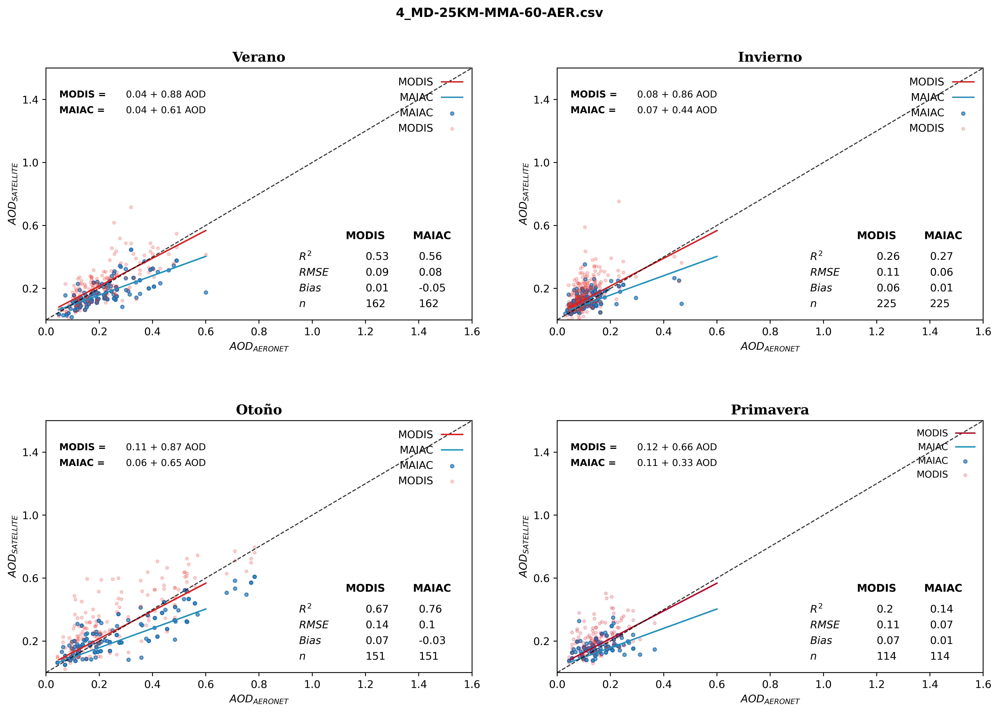

In [48]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
#                                     MEDELLIN
# =============================================================================
os.chdir('D:/Josefina/paper_git/paper_maiac/datasets/processed/MMA_v2/')
archivo = "4_MD-25KM-MMA-60-AER.csv"
md = pd.read_csv(archivo)
data_md= pd.DataFrame(md) 
data_md = data_md.dropna()
data_md['Month'] = pd.DatetimeIndex(data_md['date']).month #revisar porque me toma los datos del dia y nodel mes
#Creo columnas en los df
data_md['season'] = None
n = len(data_md)

for i in range(0,n): #Cambiar el numero de filas 
    if data_md['Month'][i] == 12 or data_md['Month'][i] == 1 or data_md['Month'][i] == 2:
        data_md['season'][i] = 1        
    elif data_md['Month'][i] == 3 or data_md['Month'][i] == 4 or data_md['Month'][i]  == 5:
        data_md['season'][i] = 2
    elif data_md['Month'][i] == 6 or data_md['Month'][i] == 7 or data_md['Month'][i] == 8:
        data_md['season'][i] = 3
    elif data_md['Month'][i] == 9 or data_md['Month'][i] == 10 or data_md['Month'][i] == 11:
        data_md['season'][i] = 4
#Separo las columnas por emdación del año                    
v_data_md = data_md[data_md['season'] == 1]
o_data_md = data_md[data_md['season'] == 2]
i_data_md = data_md[data_md['season'] == 3]
p_data_md = data_md[data_md['season'] == 4]
#print(v_data_md)

# PLOT

fig, ax = plt.subplots(ncols=2,nrows=2,  figsize=(16,10),dpi=500)
#The folder where the files of each mdation are located is browsed.


    ########################                VARIABLES                ########################
# ----------------VERANO
y_modis_v = v_data_md ["AOD_550_MODIS_mean"]
y_maiac_v= v_data_md["AOD_550_MAIAC_mean"]
x_v= v_data_md["AOD_550_AER_mean"]
n_v = len(x_v)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_v , intercept_maiac_v , r_maiac_v , p_maiac_v , stderr_maiac_v  = scipy.stats.linregress(x_v , y_maiac_v)
slope_modis_v , intercept_modis_v , r_modis_v , p_modis_v , stderr_modis_v  = scipy.stats.linregress(x_v, y_modis_v)

# R2
R2_modis_v=r_modis_v*r_modis_v
R2_maiac_v=r_maiac_v*r_maiac_v
#Calculo RMSE
RMSE_modis_v = mean_squared_error(y_modis_v, x_v, squared = False)
RMSE_maiac_v = mean_squared_error(y_maiac_v, x_v, squared = False)
bias_modis_v = round(( sum(y_modis_v - x_v)/n_v),2)
bias_maiac_v = round(( sum(y_maiac_v - x_v)/n_v),2)

y_modis_rshp_v = v_data_md ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_v= v_data_md["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_v= v_data_md["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_v = LinearRegression()
linear_regresion_maiac_v = LinearRegression()

linear_regresion_modis_v.fit(x_rshp_v,y_modis_rshp_v)
linear_regresion_maiac_v.fit(x_rshp_v,y_maiac_rshp_v)

li_predict_maiac_v = linear_regresion_maiac_v.predict(x_rshp_v)
li_predict_modis_v = linear_regresion_modis_v.predict(x_rshp_v)


# ---------------- INVIERNO
y_modis_i = i_data_md ["AOD_550_MODIS_mean"]
y_maiac_i= i_data_md["AOD_550_MAIAC_mean"]
x_i = i_data_md["AOD_550_AER_mean"]
n_i = len(x_i)
#Calculo la pendiente, la ordenada al origen y el R2

slope_maiac_i , intercept_maiac_i , r_maiac_i , p_maiac_i , stderr_maiac_i  = scipy.stats.linregress(x_i , y_maiac_i)
slope_modis_i , intercept_modis_i , r_modis_i , p_modis_i , stderr_modis_i  = scipy.stats.linregress(x_i, y_modis_i)
# R2
R2_modis_i=r_modis_i*r_modis_i
R2_maiac_i=r_maiac_i*r_maiac_i
#Calculo RMSE
RMSE_modis_i = mean_squared_error(y_modis_i, x_i, squared = False)
RMSE_maiac_i = mean_squared_error(y_maiac_i, x_i, squared = False)
bias_modis_i = round(( sum(y_modis_i - x_i)/n_i),2)
bias_maiac_i = round(( sum(y_maiac_i - x_i)/n_i),2)
y_modis_rshp_i = v_data_md ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_i= v_data_md["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_i= v_data_md["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_i = LinearRegression()
linear_regresion_maiac_i = LinearRegression()

linear_regresion_modis_i.fit(x_rshp_i,y_modis_rshp_i)
linear_regresion_maiac_i.fit(x_rshp_i,y_maiac_rshp_i)

li_predict_maiac_i = linear_regresion_maiac_i.predict(x_rshp_i)
li_predict_modis_i = linear_regresion_modis_i.predict(x_rshp_i)

# ---------------- OTOÑO
y_modis_o = o_data_md ["AOD_550_MODIS_mean"]
y_maiac_o= o_data_md["AOD_550_MAIAC_mean"]
x_o= o_data_md["AOD_550_AER_mean"]
n_o = len(x_o)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_o , intercept_maiac_o , r_maiac_o , p_maiac_o , stderr_maiac_o  = scipy.stats.linregress(x_o , y_maiac_o)
slope_modis_o , intercept_modis_o , r_modis_o , p_modis_o , stderr_modis_o  = scipy.stats.linregress(x_o, y_modis_o)
# R2
R2_modis_o=r_modis_o*r_modis_o
R2_maiac_o=r_maiac_o*r_maiac_o
#Calculo RMSE
RMSE_modis_o = mean_squared_error(y_modis_o, x_o, squared = False)
RMSE_maiac_o = mean_squared_error(y_maiac_o, x_o, squared = False)
bias_modis_o = round(( sum(y_modis_o - x_o)/n_o),2)
bias_maiac_o = round(( sum(y_maiac_o - x_o)/n_o),2)
y_modis_rshp_o = v_data_md ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_o= v_data_md["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_o= v_data_md["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_o = LinearRegression()
linear_regresion_maiac_o = LinearRegression()

linear_regresion_modis_o.fit(x_rshp_o,y_modis_rshp_o)
linear_regresion_maiac_o.fit(x_rshp_o,y_maiac_rshp_o)

li_predict_maiac_o = linear_regresion_maiac_o.predict(x_rshp_o)
li_predict_modis_o = linear_regresion_modis_o.predict(x_rshp_o)

# ---------------- PRIMAVERA
y_modis_p = p_data_md ["AOD_550_MODIS_mean"]
y_maiac_p= p_data_md["AOD_550_MAIAC_mean"]
x_p= p_data_md["AOD_550_AER_mean"]
n_p = len(x_p)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_p , intercept_maiac_p , r_maiac_p , p_maiac_p , stderr_maiac_p  = scipy.stats.linregress(x_p , y_maiac_p)
slope_modis_p , intercept_modis_p , r_modis_p , p_modis_p , stderr_modis_p  = scipy.stats.linregress(x_p, y_modis_p)
# R2
R2_modis_p=r_modis_p*r_modis_p
R2_maiac_p=r_maiac_p*r_maiac_p
#Calculo RMSE
RMSE_modis_p = mean_squared_error(y_modis_p, x_p, squared = False)
RMSE_maiac_p = mean_squared_error(y_maiac_p, x_p, squared = False)
bias_modis_p = round(( sum(y_modis_p - x_p)/n_p),2)
bias_maiac_p = round(( sum(y_maiac_p - x_p)/n_p),2)
y_modis_rshp_p = v_data_md ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_p= v_data_md["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_p= v_data_md["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_p = LinearRegression()
linear_regresion_maiac_p = LinearRegression()

linear_regresion_modis_p.fit(x_rshp_p,y_modis_rshp_p)
linear_regresion_maiac_p.fit(x_rshp_p,y_maiac_rshp_p)

li_predict_maiac_p = linear_regresion_maiac_p.predict(x_rshp_p)
li_predict_modis_p = linear_regresion_modis_p.predict(x_rshp_p)



########################                PLOT    VERANO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][0].scatter(x_v, y_maiac_v,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][0].scatter(x_v, y_modis_v,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][0].plot(x_rshp_v,li_predict_modis_v,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][0].plot(x_rshp_v,li_predict_maiac_v,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")
#add the line 1:1
ax[0][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][0].set_xlim(0, 1.6)
ax[0][0].set_ylim(0, 1.6)

## Linear regression equation
ax[0][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][0].text(0.3, 1.4, (str(round (intercept_modis_v,2)) + " + "+ str(round (slope_modis_v,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmdyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][0].text(0.3, 1.3, (str(round (intercept_maiac_v,2)) + " + "+ str(round (slope_maiac_v,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmdyle="round", fc=(1.0, 0.99, 0.99)))

# mdatimdics by mdation
ax[0][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#mdatimdics by mdation for MODIS
ax[0][0].text(1.20, 0.4,(round(R2_modis_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.20, 0.30,  (round(RMSE_modis_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.20, 0.2, (round(bias_modis_v,2)) , fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.20, 0.1, n_v , fontsize=10,ha="left", va="center")

# mdatimdics by mdation for  MAIAC
ax[0][0].text(1.40, 0.4,(round(R2_maiac_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.40, 0.30,   (round(RMSE_maiac_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.40, 0.2,  bias_maiac_v, fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.40, 0.1,  n_v , fontsize=10,ha="left", va="center")

# Title of each subplot corremdonds to the name of the AERONET mdation.
ax[0][0].set_title("Verano",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend

ax[0][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
# Configuration of subplots

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)

########################                PLOT    INVIERNO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][1].scatter(x_i, y_maiac_i, c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][1].scatter(x_i, y_modis_i,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][1].plot(x_rshp_i,li_predict_modis_i,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][1].plot(x_rshp_i,li_predict_maiac_i,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[0][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][1].set_xlim(0, 1.6)
ax[0][1].set_ylim(0, 1.6)

## Linear regression equation
ax[0][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][1].text(0.3, 1.4, (str(round (intercept_modis_i,2)) + " + "+ str(round (slope_modis_i,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmdyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][1].text(0.3, 1.3, (str(round (intercept_maiac_i,2)) + " + "+ str(round (slope_maiac_i,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmdyle="round", fc=(1.0, 0.99, 0.99)))

# mdatimdics by mdation
ax[0][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#mdatimdics by mdation for MODIS
ax[0][1].text(1.20, 0.4,(round(R2_modis_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.20, 0.30,  (round(RMSE_modis_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.20, 0.2, (round(bias_modis_i,2)) , fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.20, 0.1, n_i , fontsize=10,ha="left", va="center")

# mdatimdics by mdation for  MAIAC
ax[0][1].text(1.40, 0.4,(round(R2_maiac_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.40, 0.30,   (round(RMSE_maiac_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.40, 0.2,  bias_maiac_i, fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.40, 0.1,  n_i , fontsize=10,ha="left", va="center")

# Title of each subplot corremdonds to the name of the AERONET mdation.
ax[0][1].set_title("Invierno",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[0][1].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    OTOÑO           ########################
# Figure

#Scatter plot Unit vs Ref
ax[1][0].scatter(x_o, y_maiac_o,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][0].scatter(x_o, y_modis_o,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[1][0].plot(x_rshp_o,li_predict_modis_o,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][0].plot(x_rshp_o,li_predict_maiac_o,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][0].set_xlim(0, 1.6)
ax[1][0].set_ylim(0, 1.6)

## Linear regression equation
ax[1][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][0].text(0.3, 1.4, (str(round (intercept_modis_o,2)) + " + "+ str(round (slope_modis_o,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmdyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][0].text(0.3, 1.3, (str(round (intercept_maiac_o,2)) + " + "+ str(round (slope_maiac_o,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmdyle="round", fc=(1.0, 0.99, 0.99)))

# mdatimdics by mdation
ax[1][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#mdatimdics by mdation for MODIS
ax[1][0].text(1.20, 0.4,(round(R2_modis_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.20, 0.30,  (round(RMSE_modis_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.20, 0.2, (round(bias_modis_o,2)) , fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.20, 0.1, n_o , fontsize=10,ha="left", va="center")

# mdatimdics by mdation for  MAIAC
ax[1][0].text(1.40, 0.4,(round(R2_maiac_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.40, 0.30,   (round(RMSE_maiac_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.40, 0.2,  bias_maiac_o, fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.40, 0.1,  n_o , fontsize=10,ha="left", va="center")

# Title of each subplot corremdonds to the name of the AERONET mdation.
ax[1][0].set_title("Otoño",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    PRIMAVERA          ########################
# Figure
#Scatter plot Unit vs Ref
ax[1][1].scatter(x_p, y_maiac_p,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][1].scatter(x_p, y_modis_p,  c="#fc4e2a" ,edgecolors="#bd0026",alpha=0.2,  s=7,label = "MODIS")


ax[1][1].plot(x_rshp_p,li_predict_modis_p,c="#bd0026",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][1].plot(x_rshp_p,li_predict_maiac_p,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][1].set_xlim(0, 1.6)
ax[1][1].set_ylim(0, 1.6)

## Linear regression equation
ax[1][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][1].text(0.3, 1.4, (str(round (intercept_modis_p,2)) + " + "+ str(round (slope_modis_p,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmdyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][1].text(0.3, 1.3, (str(round (intercept_maiac_p,2)) + " + "+ str(round (slope_maiac_p,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmdyle="round", fc=(1.0, 0.99, 0.99)))

# mdatimdics by mdation
ax[1][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#mdatimdics by mdation for MODIS
ax[1][1].text(1.20, 0.4,(round(R2_modis_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.20, 0.30,  (round(RMSE_modis_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.20, 0.2, (round(bias_modis_p,2)) , fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.20, 0.1, n_p , fontsize=10,ha="left", va="center")

# mdatimdics by mdation for  MAIAC
ax[1][1].text(1.40, 0.4,(round(R2_maiac_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.40, 0.30,   (round(RMSE_maiac_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.40, 0.2,  bias_maiac_p, fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.40, 0.1,  n_p , fontsize=10,ha="left", va="center")

# Title of each subplot corremdonds to the name of the AERONET mdation.
ax[1][1].set_title("Primavera",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][1].legend( frameon = False, markerfirst = False, fontsize = 9,loc='upper right')
# Axes names
ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
fig.suptitle(archivo,fontsize=12,fontweight ="bold")
nombre = archivo[0:20]+"_reg.png"
plt.savefig(nombre, dpi=500)

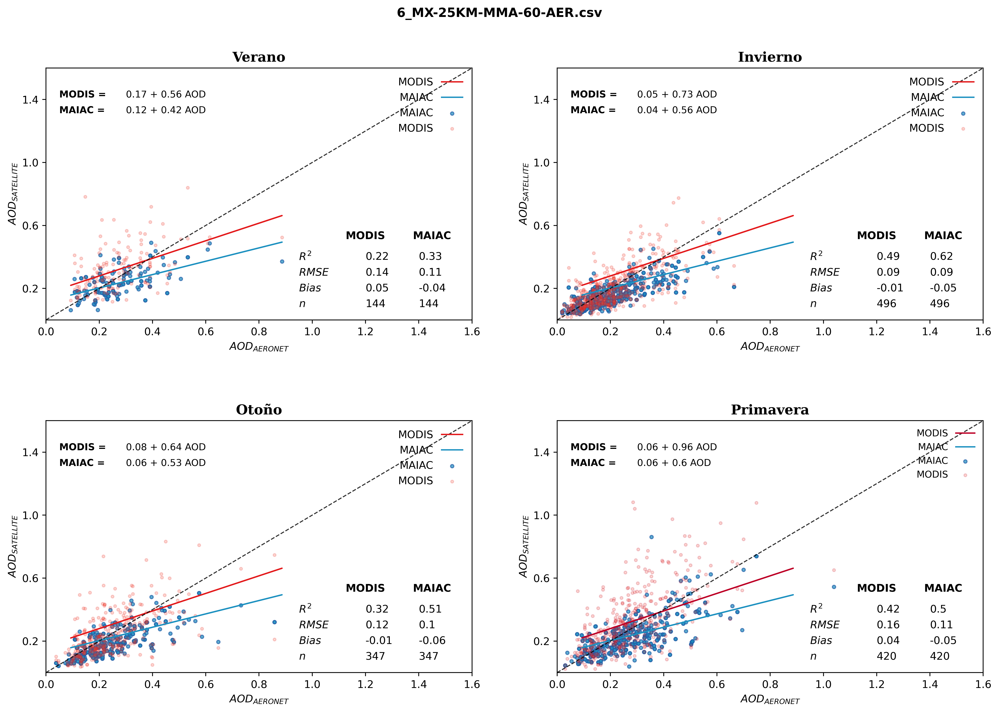

In [53]:
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
#                                     MEXICO
# =============================================================================
os.chdir('D:/Josefina/paper_git/paper_maiac/datasets/processed/MMA_v2/')
archivo = "6_MX-25KM-MMA-60-AER.csv"
mx = pd.read_csv(archivo)
data_mx= pd.DataFrame(mx) 
data_mx = data_mx.dropna()
data_mx['Month'] = pd.DatetimeIndex(data_mx['date']).month #revisar porque me toma los datos del dia y nodel mes
#Creo columnas en los df
data_mx['season'] = None
n = len(data_mx)
# OTRO CONTINUENTE
for i in range(0,n): #Cambiar el numero de filas 
    if data_mx['Month'][i] == 12 or data_mx['Month'][i] == 1 or data_mx['Month'][i] == 2:
        data_mx['season'][i] = 3        
    elif data_mx['Month'][i] == 3 or data_mx['Month'][i] == 4 or data_mx['Month'][i]  == 5:
        data_mx['season'][i] = 4
    elif data_mx['Month'][i] == 6 or data_mx['Month'][i] == 7 or data_mx['Month'][i] == 8:
        data_mx['season'][i] = 1
    elif data_mx['Month'][i] == 9 or data_mx['Month'][i] == 10 or data_mx['Month'][i] == 11:
        data_mx['season'][i] = 2
#Separo las columnas por emxación del año                    
v_data_mx = data_mx[data_mx['season'] == 1]
o_data_mx = data_mx[data_mx['season'] == 2]
i_data_mx = data_mx[data_mx['season'] == 3]
p_data_mx = data_mx[data_mx['season'] == 4]
#print(v_data_mx)

# PLOT

fig, ax = plt.subplots(ncols=2,nrows=2,  figsize=(16,10),dpi=500)
#The folder where the files of each mxation are located is browsed.


    ########################                VARIABLES                ########################
# ----------------VERANO
y_modis_v = v_data_mx ["AOD_550_MODIS_mean"]
y_maiac_v= v_data_mx["AOD_550_MAIAC_mean"]
x_v= v_data_mx["AOD_550_AER_mean"]
n_v = len(x_v)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_v , intercept_maiac_v , r_maiac_v , p_maiac_v , stderr_maiac_v  = scipy.stats.linregress(x_v , y_maiac_v)
slope_modis_v , intercept_modis_v , r_modis_v , p_modis_v , stderr_modis_v  = scipy.stats.linregress(x_v, y_modis_v)

# R2
R2_modis_v=r_modis_v*r_modis_v
R2_maiac_v=r_maiac_v*r_maiac_v
#Calculo RMSE
RMSE_modis_v = mean_squared_error(y_modis_v, x_v, squared = False)
RMSE_maiac_v = mean_squared_error(y_maiac_v, x_v, squared = False)
bias_modis_v = round(( sum(y_modis_v - x_v)/n_v),2)
bias_maiac_v = round(( sum(y_maiac_v - x_v)/n_v),2)

y_modis_rshp_v = v_data_mx ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_v= v_data_mx["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_v= v_data_mx["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_v = LinearRegression()
linear_regresion_maiac_v = LinearRegression()

linear_regresion_modis_v.fit(x_rshp_v,y_modis_rshp_v)
linear_regresion_maiac_v.fit(x_rshp_v,y_maiac_rshp_v)

li_predict_maiac_v = linear_regresion_maiac_v.predict(x_rshp_v)
li_predict_modis_v = linear_regresion_modis_v.predict(x_rshp_v)


# ---------------- INVIERNO
y_modis_i = i_data_mx ["AOD_550_MODIS_mean"]
y_maiac_i= i_data_mx["AOD_550_MAIAC_mean"]
x_i = i_data_mx["AOD_550_AER_mean"]
n_i = len(x_i)
#Calculo la pendiente, la ordenada al origen y el R2

slope_maiac_i , intercept_maiac_i , r_maiac_i , p_maiac_i , stderr_maiac_i  = scipy.stats.linregress(x_i , y_maiac_i)
slope_modis_i , intercept_modis_i , r_modis_i , p_modis_i , stderr_modis_i  = scipy.stats.linregress(x_i, y_modis_i)
# R2
R2_modis_i=r_modis_i*r_modis_i
R2_maiac_i=r_maiac_i*r_maiac_i
#Calculo RMSE
RMSE_modis_i = mean_squared_error(y_modis_i, x_i, squared = False)
RMSE_maiac_i = mean_squared_error(y_maiac_i, x_i, squared = False)
bias_modis_i = round(( sum(y_modis_i - x_i)/n_i),2)
bias_maiac_i = round(( sum(y_maiac_i - x_i)/n_i),2)
y_modis_rshp_i = v_data_mx ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_i= v_data_mx["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_i= v_data_mx["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_i = LinearRegression()
linear_regresion_maiac_i = LinearRegression()

linear_regresion_modis_i.fit(x_rshp_i,y_modis_rshp_i)
linear_regresion_maiac_i.fit(x_rshp_i,y_maiac_rshp_i)

li_predict_maiac_i = linear_regresion_maiac_i.predict(x_rshp_i)
li_predict_modis_i = linear_regresion_modis_i.predict(x_rshp_i)

# ---------------- OTOÑO
y_modis_o = o_data_mx ["AOD_550_MODIS_mean"]
y_maiac_o= o_data_mx["AOD_550_MAIAC_mean"]
x_o= o_data_mx["AOD_550_AER_mean"]
n_o = len(x_o)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_o , intercept_maiac_o , r_maiac_o , p_maiac_o , stderr_maiac_o  = scipy.stats.linregress(x_o , y_maiac_o)
slope_modis_o , intercept_modis_o , r_modis_o , p_modis_o , stderr_modis_o  = scipy.stats.linregress(x_o, y_modis_o)
# R2
R2_modis_o=r_modis_o*r_modis_o
R2_maiac_o=r_maiac_o*r_maiac_o
#Calculo RMSE
RMSE_modis_o = mean_squared_error(y_modis_o, x_o, squared = False)
RMSE_maiac_o = mean_squared_error(y_maiac_o, x_o, squared = False)
bias_modis_o = round(( sum(y_modis_o - x_o)/n_o),2)
bias_maiac_o = round(( sum(y_maiac_o - x_o)/n_o),2)
y_modis_rshp_o = v_data_mx ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_o= v_data_mx["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_o= v_data_mx["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_o = LinearRegression()
linear_regresion_maiac_o = LinearRegression()

linear_regresion_modis_o.fit(x_rshp_o,y_modis_rshp_o)
linear_regresion_maiac_o.fit(x_rshp_o,y_maiac_rshp_o)

li_predict_maiac_o = linear_regresion_maiac_o.predict(x_rshp_o)
li_predict_modis_o = linear_regresion_modis_o.predict(x_rshp_o)

# ---------------- PRIMAVERA
y_modis_p = p_data_mx ["AOD_550_MODIS_mean"]
y_maiac_p= p_data_mx["AOD_550_MAIAC_mean"]
x_p= p_data_mx["AOD_550_AER_mean"]
n_p = len(x_p)
#Calculo la pendiente, la ordenada al origen y el R2
slope_maiac_p , intercept_maiac_p , r_maiac_p , p_maiac_p , stderr_maiac_p  = scipy.stats.linregress(x_p , y_maiac_p)
slope_modis_p , intercept_modis_p , r_modis_p , p_modis_p , stderr_modis_p  = scipy.stats.linregress(x_p, y_modis_p)
# R2
R2_modis_p=r_modis_p*r_modis_p
R2_maiac_p=r_maiac_p*r_maiac_p
#Calculo RMSE
RMSE_modis_p = mean_squared_error(y_modis_p, x_p, squared = False)
RMSE_maiac_p = mean_squared_error(y_maiac_p, x_p, squared = False)
bias_modis_p = round(( sum(y_modis_p - x_p)/n_p),2)
bias_maiac_p = round(( sum(y_maiac_p - x_p)/n_p),2)
y_modis_rshp_p = v_data_mx ["AOD_550_MODIS_mean"].values.reshape(-1,1)
y_maiac_rshp_p= v_data_mx["AOD_550_MAIAC_mean"].values.reshape(-1,1)
x_rshp_p= v_data_mx["AOD_550_AER_mean"].values.reshape(-1,1)

linear_regresion_modis_p = LinearRegression()
linear_regresion_maiac_p = LinearRegression()

linear_regresion_modis_p.fit(x_rshp_p,y_modis_rshp_p)
linear_regresion_maiac_p.fit(x_rshp_p,y_maiac_rshp_p)

li_predict_maiac_p = linear_regresion_maiac_p.predict(x_rshp_p)
li_predict_modis_p = linear_regresion_modis_p.predict(x_rshp_p)



########################                PLOT    VERANO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][0].scatter(x_v, y_maiac_v,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][0].scatter(x_v, y_modis_v,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][0].plot(x_rshp_v,li_predict_modis_v,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][0].plot(x_rshp_v,li_predict_maiac_v,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")
#add the line 1:1
ax[0][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][0].set_xlim(0, 1.6)
ax[0][0].set_ylim(0, 1.6)

## Linear regression equation
ax[0][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][0].text(0.3, 1.4, (str(round (intercept_modis_v,2)) + " + "+ str(round (slope_modis_v,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmxyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][0].text(0.3, 1.3, (str(round (intercept_maiac_v,2)) + " + "+ str(round (slope_maiac_v,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmxyle="round", fc=(1.0, 0.99, 0.99)))

# mxatimxics by mxation
ax[0][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#mxatimxics by mxation for MODIS
ax[0][0].text(1.20, 0.4,(round(R2_modis_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.20, 0.30,  (round(RMSE_modis_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.20, 0.2, (round(bias_modis_v,2)) , fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.20, 0.1, n_v , fontsize=10,ha="left", va="center")

# mxatimxics by mxation for  MAIAC
ax[0][0].text(1.40, 0.4,(round(R2_maiac_v,2)) , fontsize=10, ha="left", va="center")
ax[0][0].text(1.40, 0.30,   (round(RMSE_maiac_v,2)) , fontsize=10,ha="left", va="center")
ax[0][0].text(1.40, 0.2,  bias_maiac_v, fontsize=10,ha="left", va="center")#,
ax[0][0].text(1.40, 0.1,  n_v , fontsize=10,ha="left", va="center")

# Title of each subplot corremxonds to the name of the AERONET mxation.
ax[0][0].set_title("Verano",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend

ax[0][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
# Configuration of subplots

plt.subplots_adjust(left=0.125,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.4)

########################                PLOT    INVIERNO            ########################
# Figure

#Scatter plot Unit vs Ref
ax[0][1].scatter(x_i, y_maiac_i, c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[0][1].scatter(x_i, y_modis_i,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[0][1].plot(x_rshp_i,li_predict_modis_i,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[0][1].plot(x_rshp_i,li_predict_maiac_i,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[0][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[0][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[0][1].set_xlim(0, 1.6)
ax[0][1].set_ylim(0, 1.6)

## Linear regression equation
ax[0][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[0][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[0][1].text(0.3, 1.4, (str(round (intercept_modis_i,2)) + " + "+ str(round (slope_modis_i,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmxyle="round", fc=(1.0, 0.99, 0.99)))
ax[0][1].text(0.3, 1.3, (str(round (intercept_maiac_i,2)) + " + "+ str(round (slope_maiac_i,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmxyle="round", fc=(1.0, 0.99, 0.99)))

# mxatimxics by mxation
ax[0][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[0][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[0][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[0][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[0][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#mxatimxics by mxation for MODIS
ax[0][1].text(1.20, 0.4,(round(R2_modis_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.20, 0.30,  (round(RMSE_modis_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.20, 0.2, (round(bias_modis_i,2)) , fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.20, 0.1, n_i , fontsize=10,ha="left", va="center")

# mxatimxics by mxation for  MAIAC
ax[0][1].text(1.40, 0.4,(round(R2_maiac_i,2)) , fontsize=10, ha="left", va="center")
ax[0][1].text(1.40, 0.30,   (round(RMSE_maiac_i,2)) , fontsize=10,ha="left", va="center")
ax[0][1].text(1.40, 0.2,  bias_maiac_i, fontsize=10,ha="left", va="center")#,
ax[0][1].text(1.40, 0.1,  n_i , fontsize=10,ha="left", va="center")

# Title of each subplot corremxonds to the name of the AERONET mxation.
ax[0][1].set_title("Invierno",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[0][1].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[0][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[0][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    OTOÑO           ########################
# Figure

#Scatter plot Unit vs Ref
ax[1][0].scatter(x_o, y_maiac_o,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][0].scatter(x_o, y_modis_o,  c="#fc4e2a" ,edgecolors="#e31a1c",alpha=0.2,  s=7,label = "MODIS")


ax[1][0].plot(x_rshp_o,li_predict_modis_o,c="#e31a1c",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][0].plot(x_rshp_o,li_predict_maiac_o,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][0].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][0].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][0].set_xlim(0, 1.6)
ax[1][0].set_ylim(0, 1.6)

## Linear regression equation
ax[1][0].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][0].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][0].text(0.3, 1.4, (str(round (intercept_modis_o,2)) + " + "+ str(round (slope_modis_o,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmxyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][0].text(0.3, 1.3, (str(round (intercept_maiac_o,2)) + " + "+ str(round (slope_maiac_o,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmxyle="round", fc=(1.0, 0.99, 0.99)))

# mxatimxics by mxation
ax[1][0].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][0].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][0].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][0].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][0].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#mxatimxics by mxation for MODIS
ax[1][0].text(1.20, 0.4,(round(R2_modis_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.20, 0.30,  (round(RMSE_modis_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.20, 0.2, (round(bias_modis_o,2)) , fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.20, 0.1, n_o , fontsize=10,ha="left", va="center")

# mxatimxics by mxation for  MAIAC
ax[1][0].text(1.40, 0.4,(round(R2_maiac_o,2)) , fontsize=10, ha="left", va="center")
ax[1][0].text(1.40, 0.30,   (round(RMSE_maiac_o,2)) , fontsize=10,ha="left", va="center")
ax[1][0].text(1.40, 0.2,  bias_maiac_o, fontsize=10,ha="left", va="center")#,
ax[1][0].text(1.40, 0.1,  n_o , fontsize=10,ha="left", va="center")

# Title of each subplot corremxonds to the name of the AERONET mxation.
ax[1][0].set_title("Otoño",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][0].legend( frameon = False, markerfirst = False, fontsize = 10,loc='upper right')
# Axes names
ax[1][0].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][0].set_ylabel(r'$AOD_{SATELLITE}$',size=10)


########################                PLOT    PRIMAVERA          ########################
# Figure
#Scatter plot Unit vs Ref
ax[1][1].scatter(x_p, y_maiac_p,  c="#1d91c0" ,edgecolor="#225ea8",alpha=0.7,  s=10,label = "MAIAC")
ax[1][1].scatter(x_p, y_modis_p,  c="#fc4e2a" ,edgecolors="#bd0026",alpha=0.2,  s=7,label = "MODIS")


ax[1][1].plot(x_rshp_p,li_predict_modis_p,c="#bd0026",linestyle="-",linewidth=1.3,label = "MODIS")
ax[1][1].plot(x_rshp_p,li_predict_maiac_p,c="#1d91c0",linestyle="-",linewidth=1.3,label = "MAIAC")

#add the line 1:1
ax[1][1].plot([0, 1.6], [0,1.6], color='black', linewidth=1, alpha=0.8, linestyle = '--')
#Ticks
ax[1][1].yaxis.set_ticks(np.arange(0.2, 1.6, 0.4))
ax[1][1].set_xlim(0, 1.6)
ax[1][1].set_ylim(0, 1.6)

## Linear regression equation
ax[1][1].text(0.05, 1.4, "MODIS =" , fontsize=9, ha="left", va="bottom", fontweight = "bold")
ax[1][1].text(0.05, 1.3, "MAIAC =", fontsize=9, ha="left", va="bottom",fontweight = "bold")
ax[1][1].text(0.3, 1.4, (str(round (intercept_modis_p,2)) + " + "+ str(round (slope_modis_p,2)) + " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmxyle="round", fc=(1.0, 0.99, 0.99)))
ax[1][1].text(0.3, 1.3, (str(round (intercept_maiac_p,2)) + " + "+ str(round (slope_maiac_p,2))+ " AOD") , fontsize=9, ha="left", va="bottom")#, bbox=dict(boxmxyle="round", fc=(1.0, 0.99, 0.99)))

# mxatimxics by mxation
ax[1][1].text(1.20, 0.5, "MODIS" , fontsize=10, ha="center", va="bottom", fontweight = "bold")
ax[1][1].text(1.45, 0.5, "MAIAC" , fontsize=10, ha="center", va="bottom",fontweight = "bold")
ax[1][1].text(0.95, 0.4, r'$R^{2}$ ', fontsize=10, ha="left", va="center")
ax[1][1].text(0.95, 0.30, r'$RMSE$ ',fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.2, r'$Bias$', fontsize=10,ha="left", va="center")
ax[1][1].text(0.95, 0.1, r'$n$    ', fontsize=10,ha="left", va="center")

#mxatimxics by mxation for MODIS
ax[1][1].text(1.20, 0.4,(round(R2_modis_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.20, 0.30,  (round(RMSE_modis_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.20, 0.2, (round(bias_modis_p,2)) , fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.20, 0.1, n_p , fontsize=10,ha="left", va="center")

# mxatimxics by mxation for  MAIAC
ax[1][1].text(1.40, 0.4,(round(R2_maiac_p,2)) , fontsize=10, ha="left", va="center")
ax[1][1].text(1.40, 0.30,   (round(RMSE_maiac_p,2)) , fontsize=10,ha="left", va="center")
ax[1][1].text(1.40, 0.2,  bias_maiac_p, fontsize=10,ha="left", va="center")#,
ax[1][1].text(1.40, 0.1,  n_p , fontsize=10,ha="left", va="center")

# Title of each subplot corremxonds to the name of the AERONET mxation.
ax[1][1].set_title("Primavera",fontsize=13,fontdict={'family': 'serif', 
  'color' : 'Black',
  'weight': 'bold',
  'size': 16})
# Tittle legend
#tittle_legend = ["MODIS","MAIAC"]
ax[1][1].legend( frameon = False, markerfirst = False, fontsize = 9,loc='upper right')
# Axes names
ax[1][1].set_xlabel(r'$AOD_{AERONET}$',size=10)
ax[1][1].set_ylabel(r'$AOD_{SATELLITE}$',size=10)
fig.suptitle(archivo,fontsize=12,fontweight ="bold")
nombre = archivo[0:20]+"_reg.png"
plt.savefig(nombre, dpi=500)